In [2]:
import skimage as ski
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

# 1. BASIC IMAGE HANDLING

Dimension = 759 X 725
Number of pixels in height is 759
Number of pixels in width is 725
Range = [0 - 255]
Minimum pixels value is 0
Maximum pixels value is 255


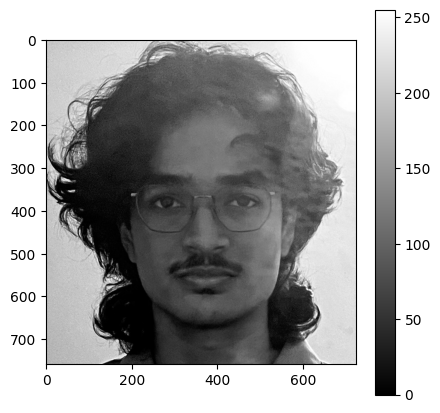

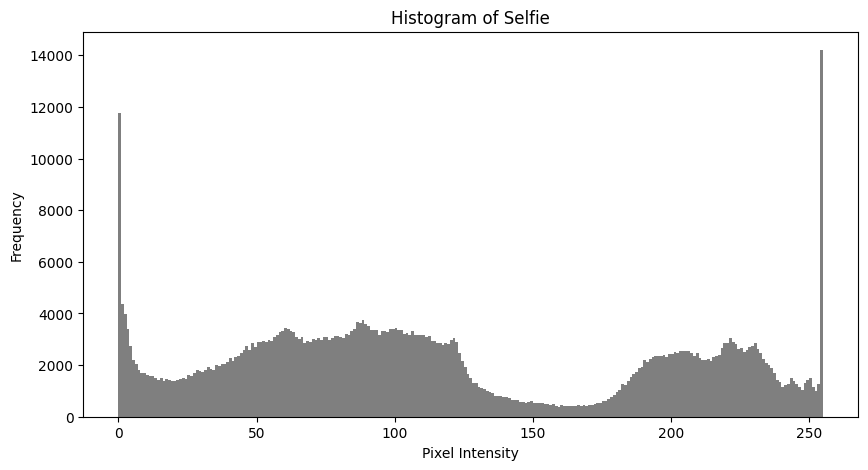

In [13]:
image = cv.imread('selfie.jpg', cv.IMREAD_GRAYSCALE)
fig,ax = plt.subplots(1,1,figsize=(5,5))
ax.imshow(image,cmap='gray')

bar = ax.imshow(image, cmap='gray')
fig.colorbar(bar, ax=ax)

min = image.min()
max = image.max()
height_pixels = image.shape[0]
width_pixels = image.shape[1]


print('Dimension = %d X %d' %(image.shape[0],image.shape[1]))
print(f'Number of pixels in height is {height_pixels}')
print(f'Number of pixels in width is {width_pixels}')
print('Range = [%d - %d]' %(image.min(),image.max()))
print(f'Minimum pixels value is {min}')
print(f'Maximum pixels value is {max}')

plt.figure(figsize=(10, 5))
plt.hist(image.ravel(), bins=255, range=(0, 255), color='black', alpha=0.5)

plt.title('Histogram of Selfie')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.show()

# 1. OBSERVATIONS

The image has dimensions of 759 x 725 that is 759 pixels of height and 725 pixels of width.

The image is in 8 bit representation as the range is from 0 to 255 which is the boundary of the range for the 8 bits image.

Minimum pixel value is 0 while the maximum pixel value is 255.

In the histogram there is a spike at extreme ends because as we can see in the image top right corner there is bright white slight which cause the spike near 255 and the at bottom left is extremely dark which causes the spike at 0.

# 1. BASIC IMAGE HANDLING (Converting to 4 bit image)

Original image pixel values are from 0 to 255
4-bit image pixel values are from 0 to 15


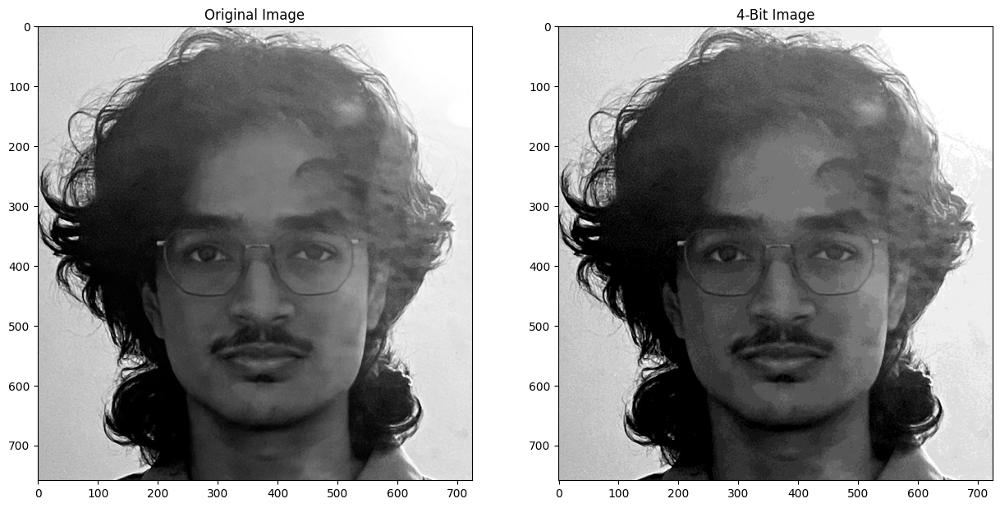

In [14]:
image = cv.imread('selfie.jpg', cv.IMREAD_GRAYSCALE)
fourbits_image = (image // 16)

fig,ax = plt.subplots(1, 2, figsize=(15, 10))


ax[0].imshow(image, cmap='gray')
ax[0].set_title('Original Image')


ax[1].imshow(fourbits_image, cmap='gray')
ax[1].set_title('4-Bit Image')

min = image.min()
max = image.max()

min_4bits = fourbits_image.min()
max_4bits = fourbits_image.max()

print(f'Original image pixel values are from {min} to {max}')
print(f'4-bit image pixel values are from {min_4bits} to {max_4bits}')

plt.show()

# 1. OBSERVATIONS
The range of 4 bit image is reduced to 0 to 15.

When the image is re quantized to a 4 bit image the range is reduced which means that the number of shades of colours from black to white is reduced or missing which will result in lesser detail of the picture.

In the 4 bit image the colour jumps in the images is more visible due to lesser number of colour shades or missing shades.

The 4 bit image looks artificial without clear colour shades or transitiions.

# 2. INTENSITY TRANSFORMATION (a) Negative of the image

Maximum intensity of the image is 255


Text(0.5, 1.0, 'Negative Image')

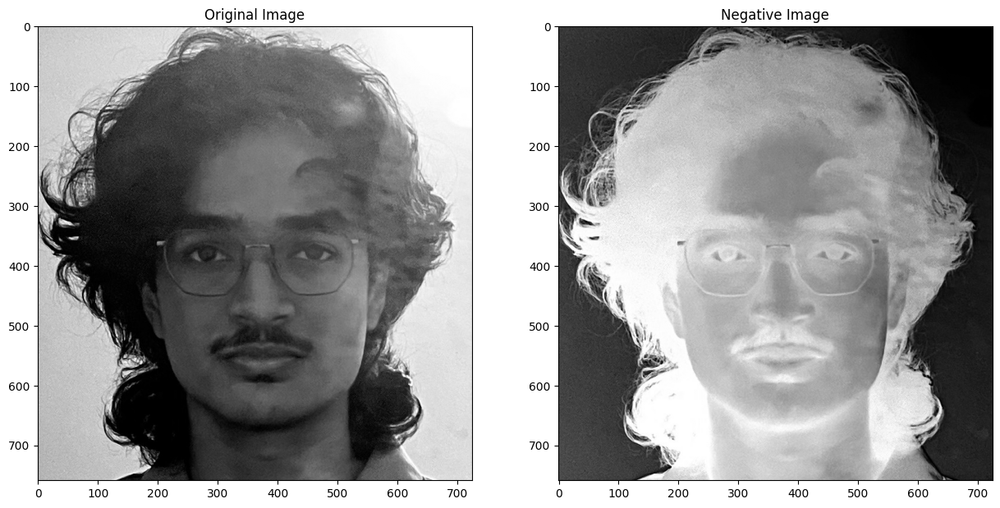

In [15]:
image = cv.imread('selfie.jpg', cv.IMREAD_GRAYSCALE)
negative_image = - (image - image.max())

print(f'Maximum intensity of the image is {image.max()}')

fig,ax = plt.subplots(1,2,figsize=(15,10))
ax[0].imshow(image,cmap='gray')
ax[1].imshow(negative_image,cmap='gray')
ax[0].set_title('Original Image')
ax[1].set_title('Negative Image')

# 2 PART(a) OBSERVATIONS

The negative of image is done by subtracting every pixel by 255 and taking minus of it which will give the opposite value of the number in the range from 0 to 255.

Example for 0 subtract 255 and we get -255 and negative of it is 255 which is the opposite of 0 in the 8 bit image's range.

This will change the white pixels to black and vice verse for all the shades.

# 2. INTENSITY TRANSFORMATION (b) Log transformation

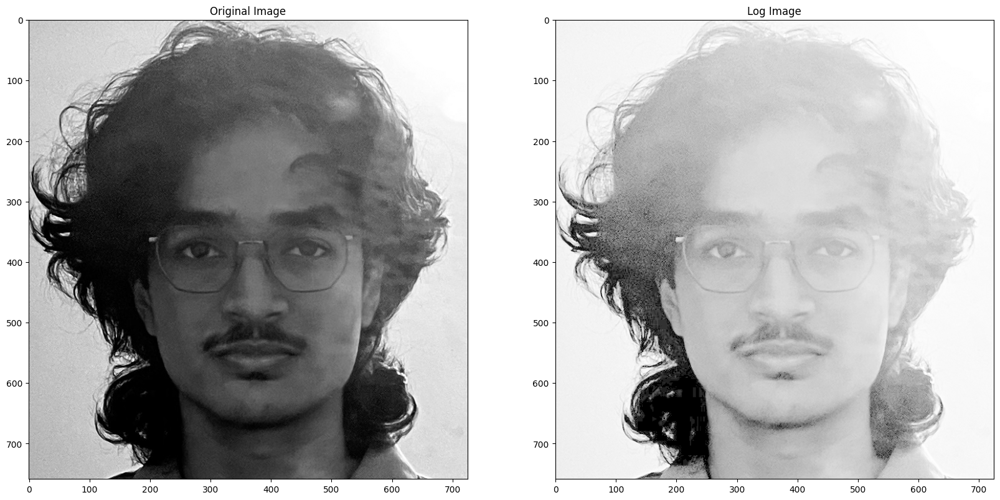

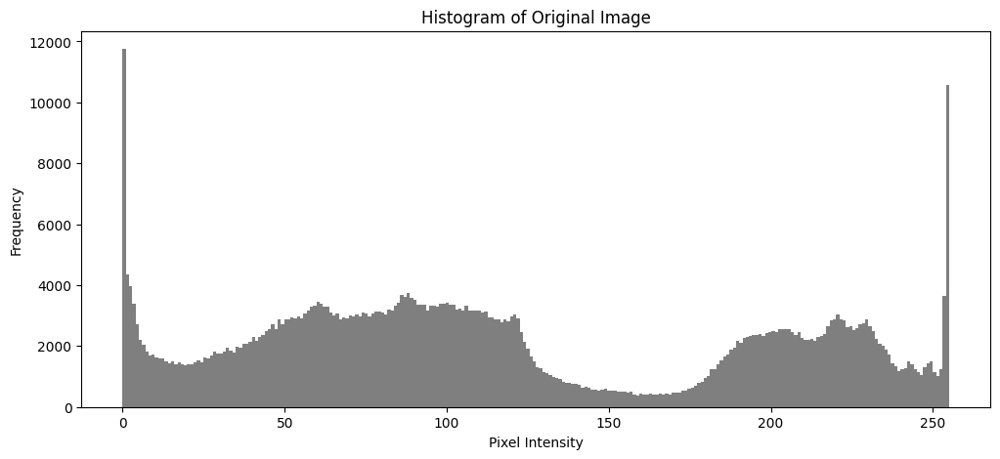

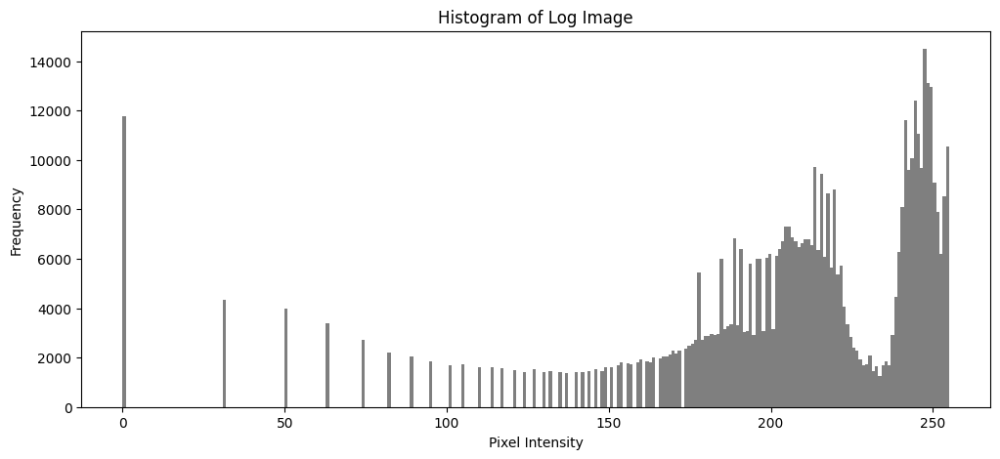

In [16]:
image = cv.imread('selfie.jpg', cv.IMREAD_GRAYSCALE)


image = image.astype(np.float32)
scale = image.max()/np.log(1+image.max()) # L-1/log L
image_log = np.array(scale * np.log(1+image), dtype = np.uint8)

fig,ax = plt.subplots(1,2,figsize=(20,30))
ax[0].imshow(image,cmap='gray')
ax[1].imshow(image_log,cmap='gray')
ax[0].set_title('Original Image')
ax[1].set_title('Log Image')

plt.figure(figsize=(12, 5))
plt.hist(image.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)

plt.title('Histogram of Original Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.figure(figsize=(12, 5))
plt.hist(image_log.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)

plt.title('Histogram of Log Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

# 2 PART(b) OBSERVATIONS

Log: $$s=c\,\,\log(1+r),$$ where &nbsp;$c$&nbsp; is a constant fixed based on the input intensity range and a required output intensity range.

If &nbsp;$r\in[0,L-1]$&nbsp; and we expect &nbsp;$s\in[0, L-1]$&nbsp; then &nbsp;$c=\dfrac{L-1}{\log L}$. That is to match the maximum value of s to maximum value of r and minimum value of s to minimum value of r.

Log transformation helps in enhancing the details in darker intensity pixels by mapping lower intensity pixels to broader range, which makes the image to look more brighter than the original image.

Hence these kind of transfrmations which maps to broader range are used in medical field such as images of x ray to view the darker regions in the image more clearly.

The histogram is moved to the right which is the brighter side.
Also, the dark pixels from original image is way more distributed than before.

When the log equation graph is plotted we can clearly see the mapping of lower intensity pixels to higher intensity pixels.

Hence, the log transformation changes each pixel value to higher value by using log which results in brighter pixels at dark areas.


# 2. INTENSITY TRANSFORMATION (c) Contrast stretching

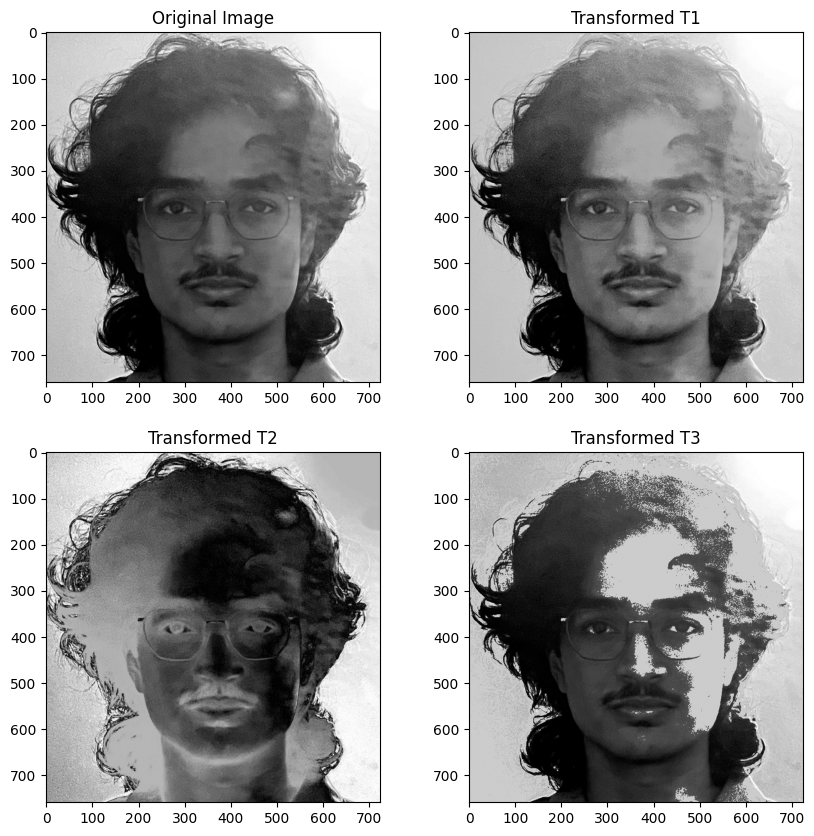

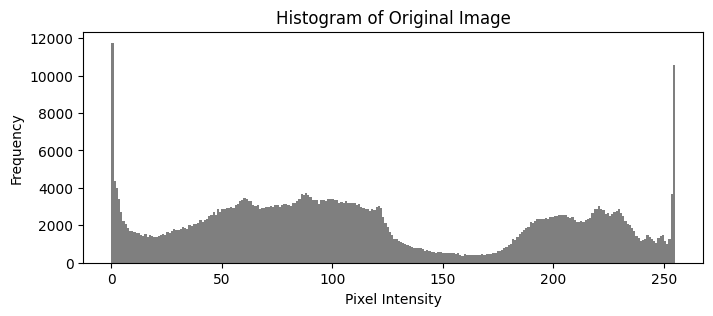

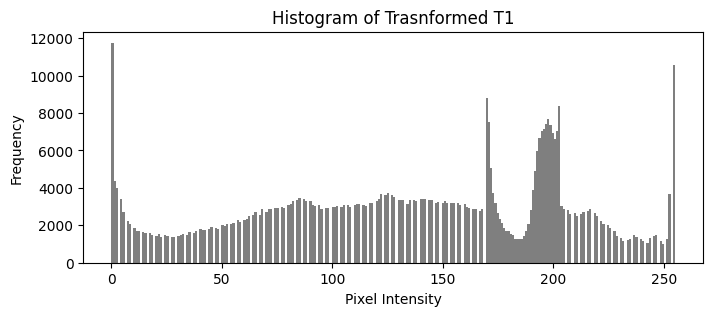

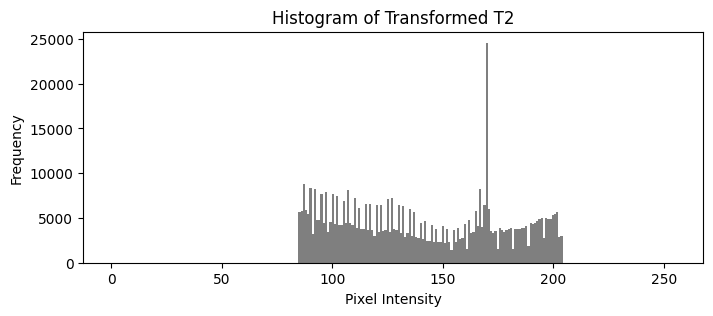

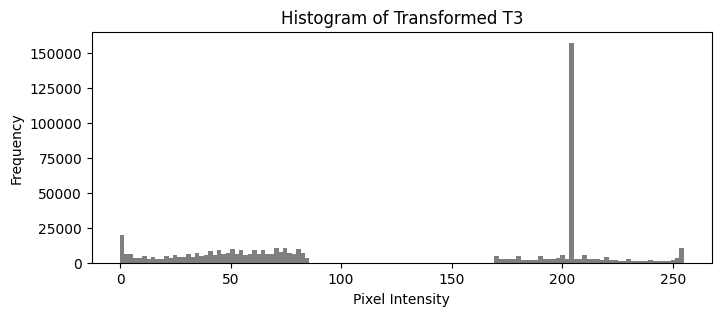

In [17]:
image = cv.imread('selfie.jpg', cv.IMREAD_GRAYSCALE)

image_t1 = np.zeros_like(image, dtype=np.uint8)

for i in range(image.shape[0]):
    for j in range(image.shape[1]):
        pixel = image[i, j]
       
        if pixel < 119:
            image_t1[i, j] = int((170 / 119) * pixel) 
      
        elif 119 <= pixel < 221:
            image_t1[i, j] = int(((204 - 170) / (221 - 119)) * (pixel - 119) + 170)
      
        else:
            image_t1[i, j] = int(((255 - 204) / (255 - 221)) * (pixel - 221) + 204)




image_t2 = np.zeros_like(image, dtype=np.uint8)

for i in range(image.shape[0]):
    for j in range(image.shape[1]):
        pixel = image[i, j]
        
        if pixel < 119:
            image_t2[i, j] = int(((85 - 170) / (119 - 0)) * (pixel - 0) + 170)
        
        elif 119 <= pixel < 221:
            image_t2[i, j] = int(((204 - 85) / (221 - 119)) * (pixel - 119) + 85)
        
        else:
            image_t2[i, j] = int(((170 - 204) / (255 - 221)) * (pixel - 221) + 204)




image_t3 = np.zeros_like(image, dtype=np.uint8)

for i in range(image.shape[0]):
    for j in range(image.shape[1]):
        pixel = image[i, j]
       
        if pixel < 102:
            image_t3[i, j] = int(((85) / (102)) * (pixel))  
        
        elif 102 <= pixel < 204:
            image_t3[i, j] = int(204) 
              
        else:
            image_t3[i, j] = int(((255 - 170) / (255 - 204)) * (pixel - 204) + 170)


fig,ax = plt.subplots(2,2,figsize=(10,10))
ax[0,0].imshow(image,cmap='gray')
ax[0,0].set_title('Original Image')

ax[0,1].imshow(image_t1,cmap='gray')
ax[0,1].set_title('Transformed T1')

ax[1,0].imshow(image_t2,cmap='gray')
ax[1,0].set_title('Transformed T2')

ax[1,1].imshow(image_t3,cmap='gray')
ax[1,1].set_title('Transformed T3')

plt.figure(figsize=(8, 3))
plt.hist(image.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)

plt.title('Histogram of Original Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.figure(figsize=(8, 3))
plt.hist(image_t1.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)

plt.title('Histogram of Trasnformed T1')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.figure(figsize=(8, 3))
plt.hist(image_t2.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)

plt.title('Histogram of Transformed T2')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.figure(figsize=(8, 3))
plt.hist(image_t3.ravel(), bins=128, range=(0, 255), color='black', alpha=0.5)

plt.title('Histogram of Transformed T3')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')


plt.show()

# 2 PART(c) OBSERVATIONS

Y = OUTPUT INTENSITY [0,255]

X = INPUT INTENSITY [0,255]




T1 function is :

$$
T_1(x) =
\begin{cases} 
\frac{170}{119}x & 0 \leq x < 119 \\ 
\frac{204-170}{221-119}(x-119) + 170 & 119 \leq x < 221 \\ 
\frac{255-204}{255-221}(x-221) + 204 & 221 \leq x \leq 255 
\end{cases}
$$


T2 function is:

$$
T_2(x) =
\begin{cases} 
\frac{85-170}{119}x + 170 & 0 \leq x < 119 \\ 
\frac{204-85}{221-119}(x-119) + 85 & 119 \leq x < 221 \\ 
\frac{170-204}{255-221}(x-221) + 204 & 221 \leq x \leq 255 
\end{cases}
$$

T3 function is :


$$
T_3(x) =
\begin{cases} 
\frac{85}{102}x & 0 \leq x < 102 \\ 
204 & 102 \leq x < 204 \\ 
\frac{255-170}{255-221}(x-204) + 170 & 204 \leq x \leq 255 
\end{cases}
$$


These functions are obtained from the graphs given which can be coded for the range of pixels and apply it to get the desired contrast stretched output.

T1 transformations:

We can see that from the graph the lower intensity pixels are expanded which makes the darker areas of the graph more brighter than usual.

In the second piece of the contrast stretching it stretched moderately which makes very slight change in the pixel's brightness.

In the last piece of the graph the intensity is preserved and doesnt change much.

Overall in the iimage the dark pixels are brighter and the contrast is improved.

HISTOGRAM: Here we can clearly see that the initial 119 pixels are distributed while from 119 to 221 they are compressed and again from 221 they are distribute broader.

T2 transformation:

The slope of first line is negative which makes the darker pixels much more darker and the second line makes the mid ranged pixels intensified and finally the lst line equation reduces the intensity of the pixels above 221 which makes it slightly darker.

The darker areas in the image are much more darker and he image lost it's detail and bright highlights are also made slightly darker.

HISTOGRAM: From the graph we can say that the output intensity is from 85 to 204 hence the histogram is restricted to these pixels as there no other pixels outside this range.

T3 transformation:

The darker pixels are intensified and made brighter with the first line equation.

The middle line equation makes the mid ranged pixels all equal to a constant value of 204.

The final line equation are intensified and brightened even more.

The darker regions and brighter regions are made much more brighter while the mid range is fixed to a single value which makes it loose all the details in that range.

HISTOGRAM: From the graph we can see till 102 pixels it's mapped to a broader range making the histogram broader till that pixel and then there is a sudden jump to 204 as many pixels are mapped to a constant value of 204 and again later the pixels are mapped to a broader range.


# 2. INTENSITY TRANSFORMATION (d) Power Law Transformation

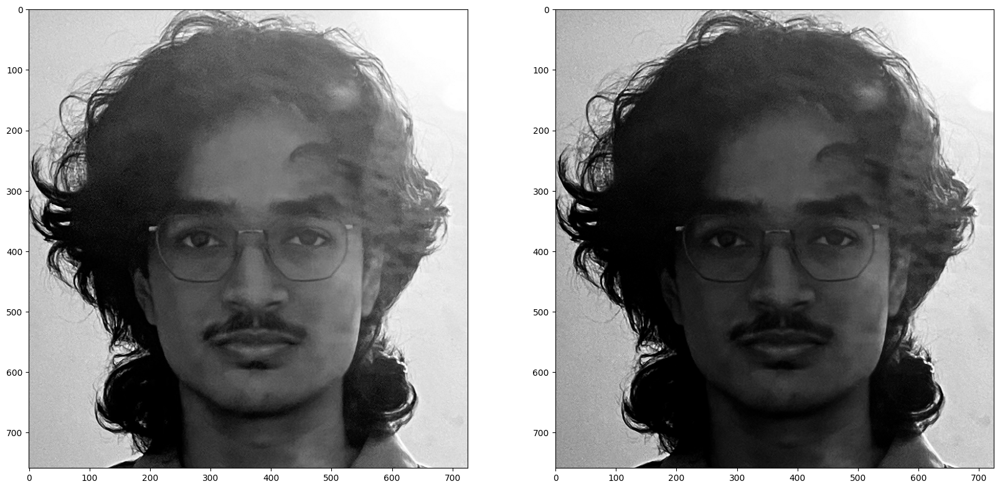

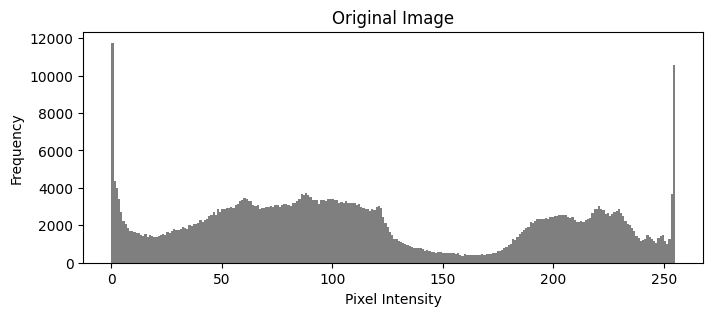

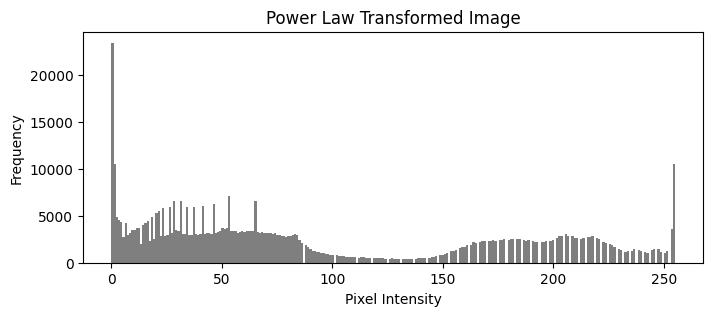

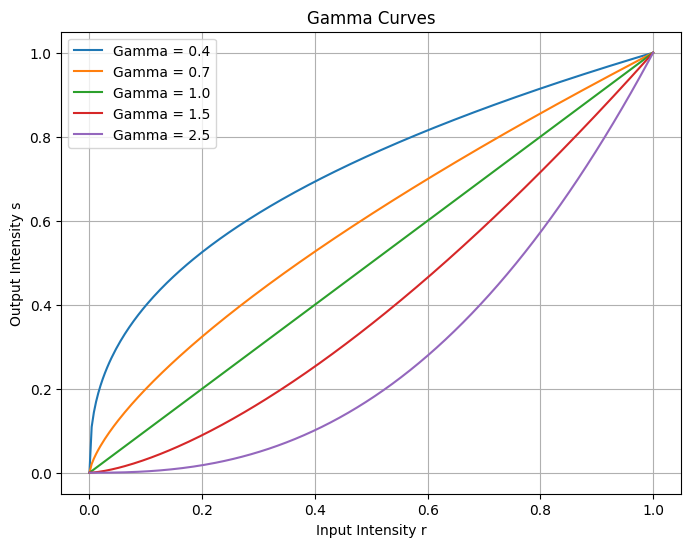

In [7]:
image = cv.imread('selfie.jpg', cv.IMREAD_GRAYSCALE)
image_gamma = ski.exposure.adjust_gamma(image,gamma= 1.5)

fig,ax = plt.subplots(1,2,figsize=(20,30))
ax[0].imshow(image,cmap='gray')
ax[1].imshow(image_gamma,cmap='gray')

plt.figure(figsize=(8, 3))
plt.hist(image.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)

plt.title('Original Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.figure(figsize=(8, 3))
plt.hist(image_gamma.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)

plt.title('Power Law Transformed Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')



r = np.linspace(0, 1, 256)
gamma_values = [0.4, 0.7, 1.0, 1.5, 2.5]
plt.figure(figsize=(8, 6))
for gamma in gamma_values:
    s = r ** gamma 
    plt.plot(r, s, label=f"Gamma = {gamma}")

plt.title("Gamma Curves")
plt.xlabel("Input Intensity r")
plt.ylabel("Output Intensity s")
plt.legend()
plt.grid()
plt.show()

# 2 PART(d) OBSERVATIONS
Power law (Gamma): 
 
 r is input image intensity
 
 s is output image intensity

$$s=c\,\,r^\gamma,$$ where &nbsp;$c$&nbsp; and &nbsp;$\gamma$&nbsp; are positive constants fixed based on the input intensity range and a required output intensity range.

Here they considered c as 1 

When gamma is 0 then s = 1 the entire image consists of black pixels this is due to the in built skimage gamma function which normalizes the pixels to 0 to 1 before applying gamma function which rounds off the values that are closer to 0 to 0.

But theoretically when applied direct that is gamme = 0. It makes the transformation s = 1 and hence all the pixels would turn white. The graph is a horizontal line.

For other values of gamma both gives the same outputs 

THAT IS 

For gamma<1 as it gets closer to 0 the image gets brighter and as it gets cloer to one the image becomes same as the original.

The graph is similar to log and acts similar to log making the image brighter as the gamma value reduces as the graph becomes more curved.

At gamma = 1 the image is same as the original image as the transformation s = r. Hence there will be no change in the image after transformation and the graph is the straight line same as before.

For gamma>1 the graph is opposite of log graph and it becomes more curved with increase in gamma that is it maps the middle range of pixels to more darker intensities making the image darker for mid ranged intensities mostly and slightly at the ends of the graph.

HISTOGRAMS:

Similary the histogram moves to the right that is brighter side for gamma < 1 and moves to the left side that is the darker side for gamma > 1 and for gamma = 1 the histogram is same as the original image.

# 2. INTENSITY TRANSFORMATION (e) Bit-Plane Slicing

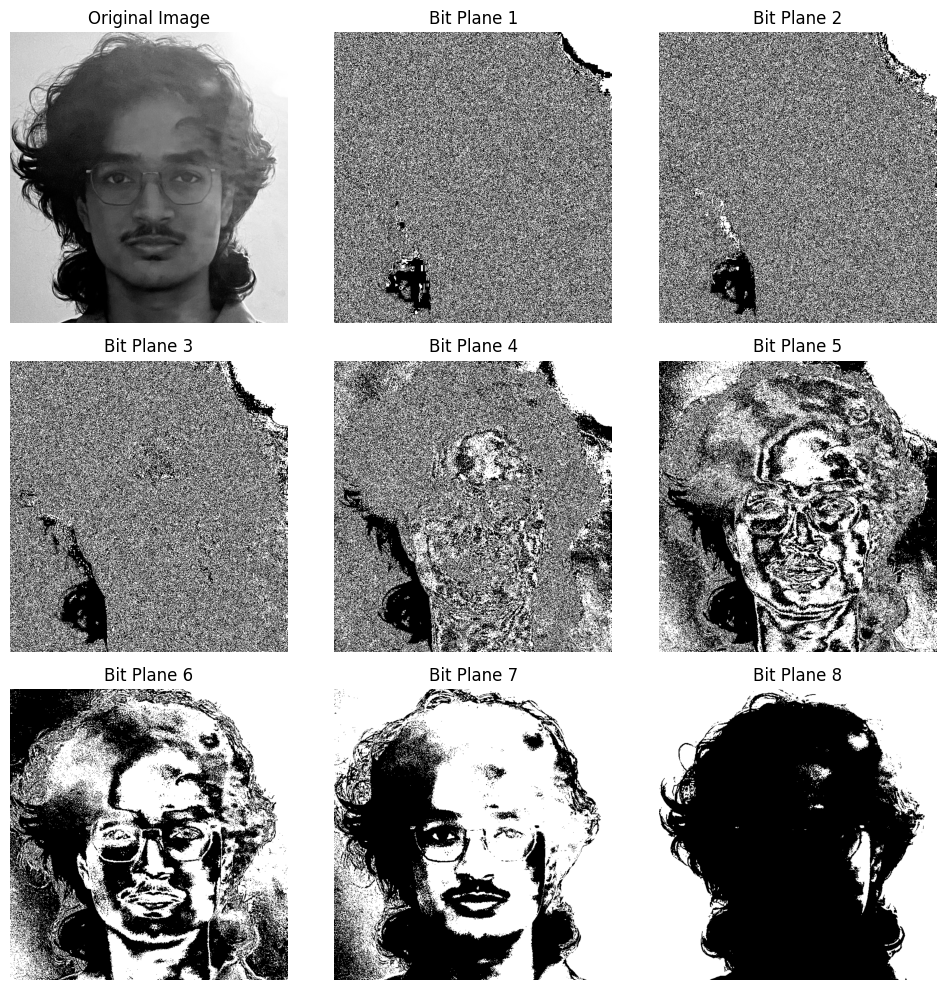

In [19]:
image = cv.imread("selfie.jpg", cv.IMREAD_GRAYSCALE)
bit_planes = []

for i in range(8):
    bit_plane = (image >> i) & 1  
    bit_plane = (bit_plane * 255).astype(np.uint8) 
    bit_planes.append(bit_plane)

plt.figure(figsize=(10,10))

plt.subplot(3, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

for i in range(8):
    plt.subplot(3, 3, i+2)
    plt.imshow(bit_planes[i], cmap='gray')
    plt.title(f"Bit Plane {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# 2 PART(e) OBSERVATIONS

8-bit grayscale image is made up of 8 bit-planes. Each bit-plane represents one bit from the binary form of each pixel’s intensity.

Lower bit-planes (1-3) contain noise, it contains least amount of information of the image.

Medium bit-plane (4-5) contains sharpness and visible textures of the image , it is more important that lower bit planes.

Higher bit-planes (6-8) store the most important details of the image, it can be seen in the output where the face features are defined. It can almost give the full details of the image as it contains major edges and the contrast regions clearly. 

Plane 8 is the most significant bit while plane 1 is the least significant bit.

Hence the image me still be defined without lower bit planes but the image will be completely lost without the higher bit planes.



# 3. SPATIAL FILTERING (a) Averaging Mask Transformation (Box Filter)

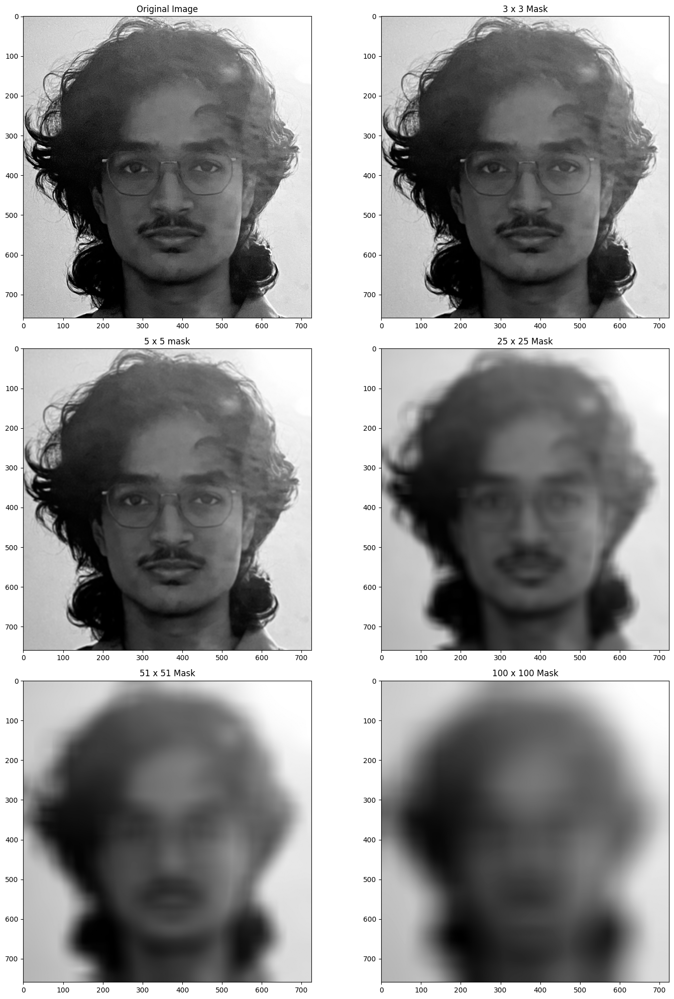

In [20]:
image = cv.imread('selfie.jpg', cv.IMREAD_GRAYSCALE)
image_blur1 = cv.blur(image, (3,3))
image_blur2 = cv.blur(image, (5,5))
image_blur3 = cv.blur(image, (25,25))
image_blur4 = cv.blur(image, (51,51))
image_blur5 = cv.blur(image, (100,100))

fig,ax = plt.subplots(3,2,figsize=(15,20))

ax[0,0].imshow(image,cmap='gray')
ax[0,0].set_title('Original Image')

ax[0,1].imshow(image_blur1,cmap='gray')
ax[0,1].set_title('3 x 3 Mask')

ax[1,0].imshow(image_blur2,cmap='gray')
ax[1,0].set_title('5 x 5 mask')

ax[1,1].imshow(image_blur3,cmap='gray')
ax[1,1].set_title('25 x 25 Mask')

ax[2,0].imshow(image_blur4,cmap='gray')
ax[2,0].set_title('51 x 51 Mask')

ax[2,1].imshow(image_blur5,cmap='gray')
ax[2,1].set_title('100 x 100 Mask')

plt.tight_layout()

# 3 PART(a) OBSERVATIONS

CORRELATION USED

$$
I'(x, y) = \sum_{s=-1}^{1} \sum_{t=-1}^{1} w(s,t) \cdot I(x+s, y+t)
$$

Here w(s,t) is the mask applied and all the values are (1/9) for 3 x 3 averaging mask.

Correlated with the image matrix will give the output.

The image is slightly blurred which makes the edges less sharp due to the smoothness between pixels intensity changes and hence the edges in the image will loose it's details.

The mask is moved over the original image matrix and convolved (correlation) which averages the values of the pixels in it's neighbourhood and replaces it by the average and this is done all over the image for all pixels by sliding the mask over it one by one.

This makes the pixels loose the sudden changes in intensity which leads to reuduction of sharp edges.

As we increase the mask size it becomes more and more blurry like looking into a foggy mirror.

This is because the neighbourhood of the average increases, for example of 25 x 25 mask, the neighbourhood of 25 pixels are considered for the averaging which is the average of almost 625 pixels, this makes the image loose much more detail than the 3 x 3 mask which only averages the neighbouring 9 pixels.

# 3. SPATIAL FILTERING (b) Correlation is not commutative

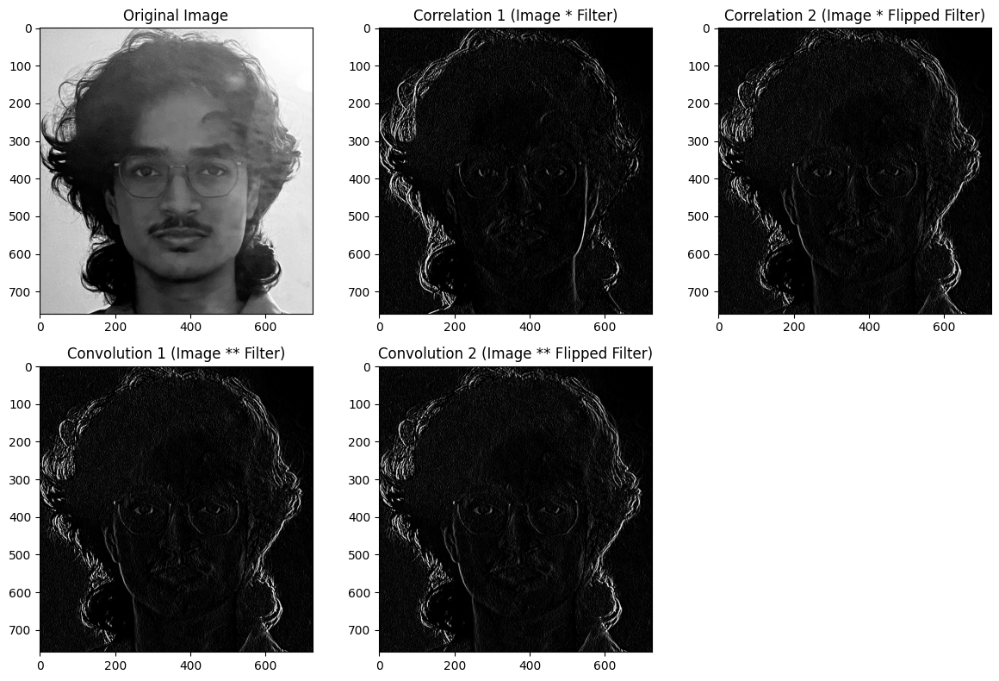

In [21]:
image = cv.imread('selfie.jpg', cv.IMREAD_GRAYSCALE)
image = image.astype(np.uint8)


filter = np.array([[1, 0, -1],
                   [2, 0, -2],
                   [1, 0, -1]])

corr1 = cv.filter2D(image, -1, filter) 
corr2 = cv.filter2D(image, -1, filter[::-1, ::-1]) 


flipped_filter = filter[::-1, ::-1]  
conv1 = cv.filter2D(image, -1, flipped_filter)  
conv2 = cv.filter2D(image, -1, flipped_filter)  


plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')

plt.subplot(2, 3, 2)
plt.title('Correlation 1 (Image * Filter)')
plt.imshow(corr1, cmap='gray')

plt.subplot(2, 3, 3)
plt.title('Correlation 2 (Image * Flipped Filter)')
plt.imshow(corr2, cmap='gray')

plt.subplot(2, 3, 4)
plt.title('Convolution 1 (Image ** Filter)')
plt.imshow(conv1, cmap='gray')

plt.subplot(2, 3, 5)
plt.title('Convolution 2 (Image ** Flipped Filter)')
plt.imshow(conv2, cmap='gray')

plt.tight_layout()
plt.show()

# 3 PART(b) OBSERVATIONS

Here I applied correlation of image and filter and convolution.

Correlation 1 and correlation 2 has very slight differneces which is not visible clearly in this image. 

The differences can be seen in another image in the code given below.

We can see that convolution is same in both.

Other image used in the code below can explain it better.

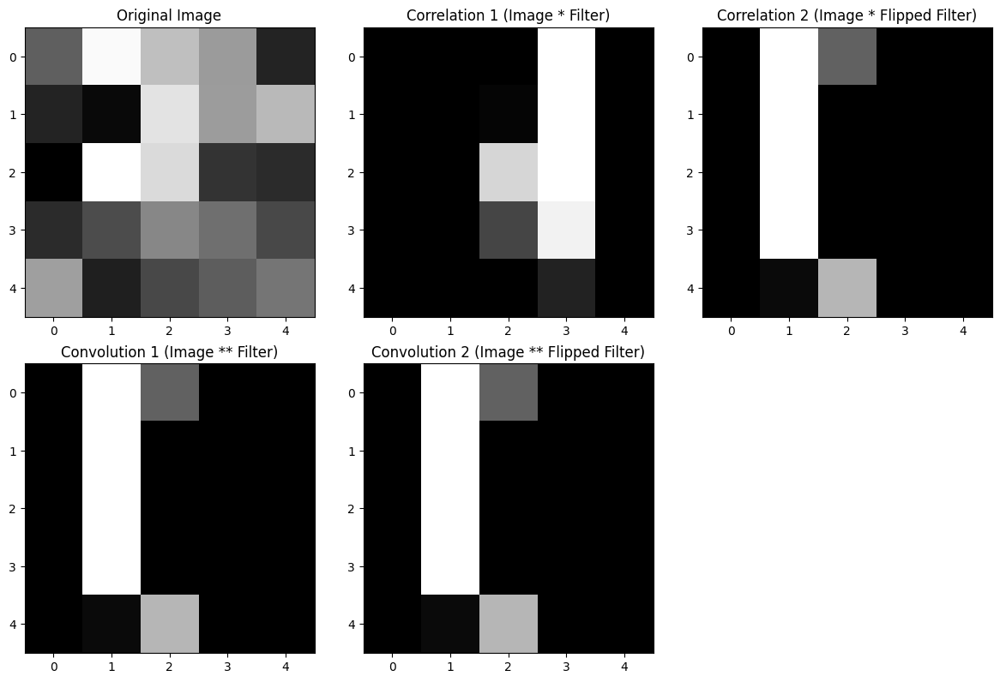

In [22]:
np.random.seed(42)
image = np.random.rand(5, 5) * 255
image = image.astype(np.uint8)

filter = np.array([[1, 0, -1],
                   [2, 0, -2],
                   [1, 0, -1]])

corr1 = cv.filter2D(image, -1, filter) 
corr2 = cv.filter2D(image, -1, filter[::-1, ::-1])  

flipped_filter = filter[::-1, ::-1] 
conv1 = cv.filter2D(image, -1, flipped_filter) 
conv2 = cv.filter2D(image, -1, flipped_filter) 

plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')

plt.subplot(2, 3, 2)
plt.title('Correlation 1 (Image * Filter)')
plt.imshow(corr1, cmap='gray')

plt.subplot(2, 3, 3)
plt.title('Correlation 2 (Image * Flipped Filter)')
plt.imshow(corr2, cmap='gray')

plt.subplot(2, 3, 4)
plt.title('Convolution 1 (Image ** Filter)')
plt.imshow(conv1, cmap='gray')

plt.subplot(2, 3, 5)
plt.title('Convolution 2 (Image ** Flipped Filter)')
plt.imshow(conv2, cmap='gray')

plt.tight_layout()
plt.show()

# 3 PART(b) OBSERVATIONS CONTINUATION

For this image where the pixels are seen clearly with clear differences we can see that when correlation is applied like image * filter it's different from filter * image. This is because for image * filter the image if flipped after applying the filter but for filter * image the filter is flipped after applying the image onto the filter. This will obviously result in different outputs.

 Hence it can be seen from the outputs that correlation is not commutative.

 Where as convolution is commutative because for image **  filter the filter is flipped first before applying the filter. This is done the same way for filter ** image the image is flipped before convolution.

As both are flipping before convolution it does not affect the output differently.

Mathematically, 



1. Correlation is Not Commutative

The correlation of an image I(x,y) with a filter K(i,j) is:

$$
C(x,y) = \sum_{i} \sum_{j} I(x+i, y+j) \cdot K(i,j)
$$

If we swap I(x,y) and K(i,j), we get:

$$
C'(x,y) = \sum_{i} \sum_{j} K(x+i, y+j) \cdot I(i,j)
$$

Since the filter is smaller than the image, the output values will be different:

$$
I(x,y) * K(i,j) \neq K(x,y) * I(i,j)
$$

Hence correlation is not commutative.



2. Convolution is Commutative

The convolution of an image I(x,y) with a filter K(i,j) is:

$$
C(x,y) = \sum_{i} \sum_{j} I(x-i, y-j) \cdot K(i,j)
$$

If we swap I(x,y) and K(i,j), we get:

$$
C'(x,y) = \sum_{i} \sum_{j} K(x-i, y-j) \cdot I(i,j)
$$

Because both cases involve the same flipped filter, we get

$$
I(x,y) ** K(i,j) = K(x,y) ** I(i,j)
$$

Thus, convolution is commutative.

---

# 3. SPATIAL FILTERING (c) Guassian Filter.

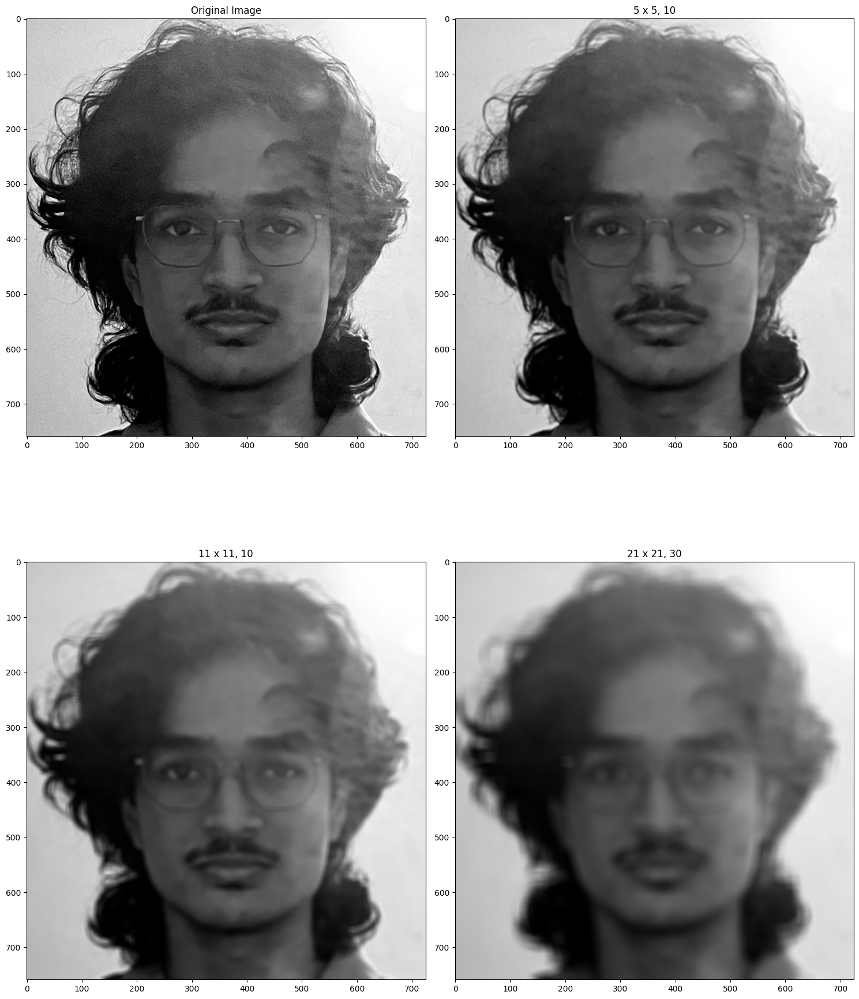

In [23]:
image = cv.imread('selfie.jpg', cv.IMREAD_GRAYSCALE)
image_gauss1 = cv.GaussianBlur(image,(5, 5),10)
image_gauss2 = cv.GaussianBlur(image,(11, 11),10)
image_gauss3 = cv.GaussianBlur(image,(21, 21),30)

fig,ax = plt.subplots(2,2,figsize=(15,20))
ax[0,0].imshow(image,cmap='gray')
ax[0,0].set_title('Original Image')
ax[0,1].imshow(image_gauss1,cmap='gray')
ax[0,1].set_title('5 x 5, 10')
ax[1,0].imshow(image_gauss2,cmap='gray')
ax[1,0].set_title('11 x 11, 10')
ax[1,1].imshow(image_gauss3,cmap='gray')
ax[1,1].set_title('21 x 21, 30')

plt.tight_layout()

# 3 PART(c) OBSERVATIONS


The neighboring pixels are symmetrically weighted by the following Gaussian kernel

$$w(s,t)= e^{-\dfrac{s^2+t^2}{2\sigma^2}}, where \quad -a\le s\le a, \,\, -b\le t\le b$$
Variable $\sigma$ is the variance which controls the 'tightness' of the bell shape.

Kernel size is the number of neighbouring pixels used to smoothen the image

Hence, smaller kernel results in lighter smoothing effects while larger kernels means that the smoothening effect is stronger and blurs the edges significantly making the image lose it's details.


Sigma is the variance it determines the influence the neighbouring intensities have on the smoothening effect. Higher the variance higher is the effect. It can be said that it determines the weightage of the pixels.

# 3. SPATIAL FILTERING (d) min, max and median filters.

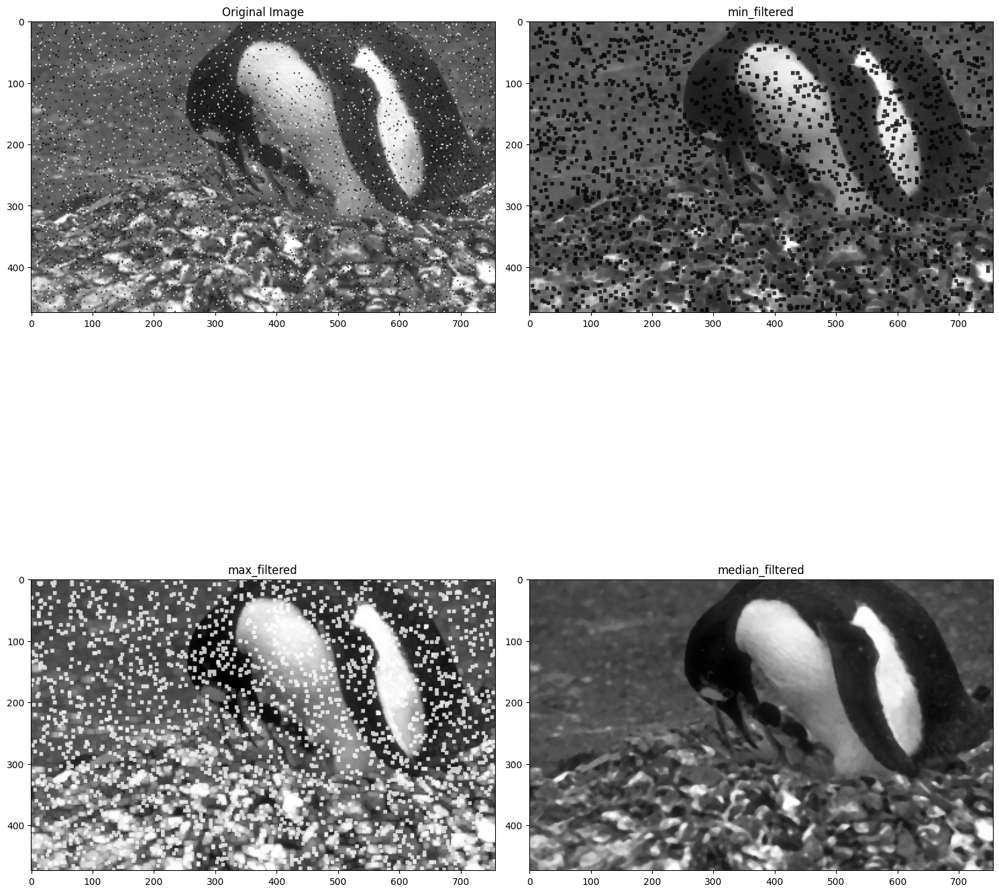

In [24]:

image = cv.imread("noise2.png", cv.IMREAD_GRAYSCALE)


kernel = np.ones((5,5), np.uint8)  # 3x3 kernel
min_filtered = cv.erode(image, kernel)


max_filtered = cv.dilate(image, kernel)


median_filtered = cv.medianBlur(image, 7)  # 3x3 Median Filter


fig,ax = plt.subplots(2,2,figsize=(15,20))

ax[0,0].imshow(image,cmap='gray')
ax[0,0].set_title('Original Image')

ax[0,1].imshow(min_filtered,cmap='gray')
ax[0,1].set_title('min_filtered')

ax[1,0].imshow(max_filtered,cmap='gray')
ax[1,0].set_title('max_filtered')

ax[1,1].imshow(median_filtered,cmap='gray')
ax[1,1].set_title('median_filtered')


plt.tight_layout()


# 3 PART(d) OBSERVATIONS

MINIMUM FILTER is used to remove small white spots also called salt. Hence in the image after filtering all the white spots are reduced but the black spots are increased significantly because each of the white pixels in the original image are replaced by the darkest pixel in the neighbourhood.Which also makes the dark spots much more darker as they are also replaced with minimum pixel value in it's neighbourhood.

$$
I_{\text{min}}(x,y) = \min_{(i,j) \in N(x,y)} I(i,j)
$$

N(x,y) is the neighbourhood being considered.
(x,y) is the pixel location.
I(i,j) are the intensity values in it's neighbourhood.

MAXIMUM FILTER is opposite of minimum filter it removes all black spots also called as pepper. Hence in the image after filtering all black spots are removed but white spots are replaced significantly because the dark spots that are removed were replaced by the lightest or highest intensity pixels in it's neighbourhood. It also makes the image brighter as this happens to all the pixels of the image that is replacing it by the lightest pixel in it's neighbourhood.

$$
I_{\text{max}}(x,y) = \max_{(i,j) \in N(x,y)} I(i,j)
$$

MEDIAN FILTER as the name suggests it replaces the centre pixel by the median value of the pixels in it's neighbourhood hence in salt and pepper noise the extreme values will be ignored. As noise is mostly due to extreme values median filter will remove the noise by replacing it with the median value from it's neighbourhood. This also makes the image preserve it's edges and in fact enhances the edges of the image.

$$
I_{\text{median}}(x,y) = \text{median} \{ I(i,j) \}, \quad (i,j) \in N(x,y)
$$


# 3. SPATIAL FILTERING (e) Laplacian Mask

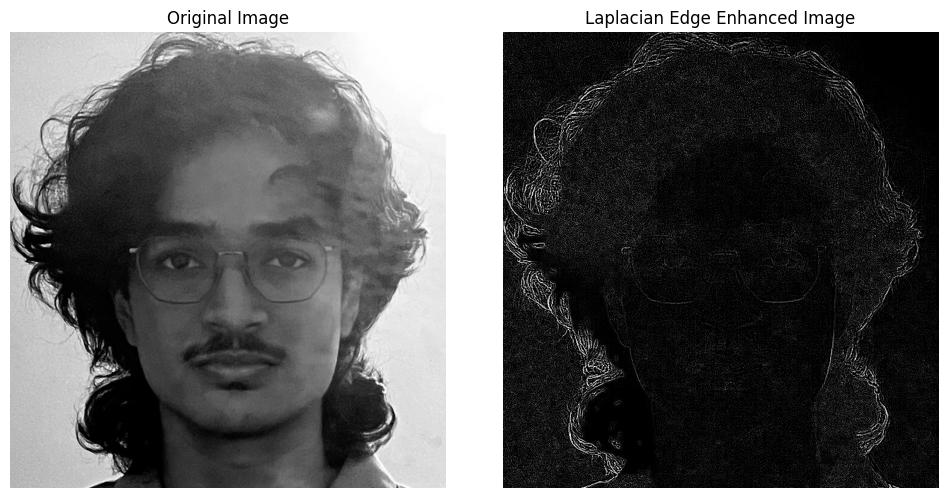

In [25]:
image = cv.imread("selfie.jpg", cv.IMREAD_GRAYSCALE)

laplacian_mask = np.array([
    [1, 1, 1],
    [1, -8, 1],
    [1, 1, 1]
], dtype=np.float32)

laplacian_filtered = cv.filter2D(image, -1, laplacian_mask)

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(laplacian_filtered, cmap='gray')
plt.title("Laplacian Edge Enhanced Image")
plt.axis('off')

plt.tight_layout()
plt.show()

# 3 PART(e) OBSERVATIONS

The given mask compares a pixel’s intensity with its eight neighboring pixels.

The large negative center value (-8) subtracts the weighted sum of neighboring pixel values, making sharp edges appear bright while other regions remain dark. The positive surrounding values (1s) detect intensity variations in all directions.

If a pixel has similar intensities around it, the sum of neighboring pixels cancels out the center pixel, giving value close to zero making to dark.

If a pixel is near an edge, the difference becomes large, creating a bright edge because of the high output difference between the pixel and it's neighbouring pixels.

Hence the outline of the image that is the edges are enchanced due to the sudden intensity change near it while the rest parts of the image is darkened.

# 3. SPATIAL FILTERING (f) Unsharp Masking

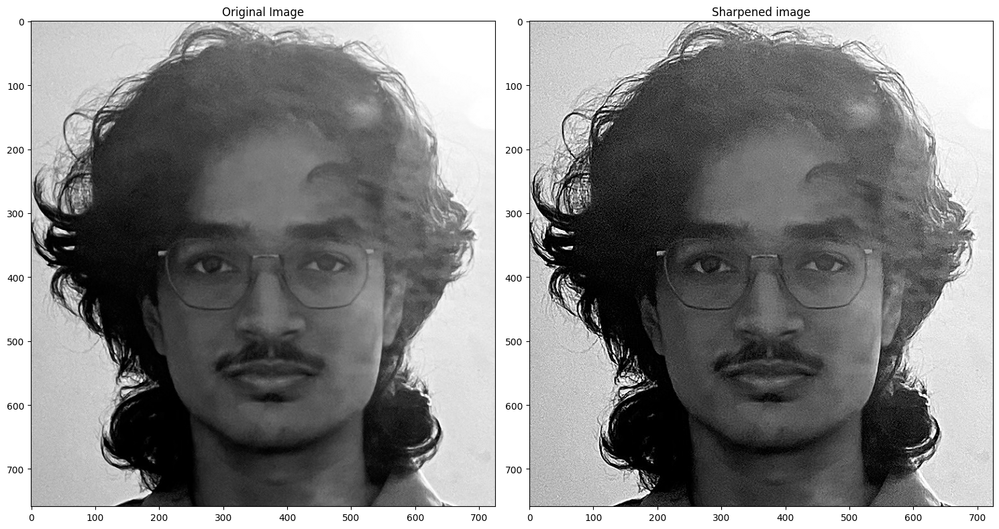

In [26]:
image = cv.imread("selfie.jpg", cv.IMREAD_GRAYSCALE)

blurred = cv.GaussianBlur(image, (5,5), sigmaX=1.5)
alpha = 1.5
unsharp_mask = cv.addWeighted(image, 1 + alpha, blurred, -alpha, 0)

fig,ax = plt.subplots(1,2,figsize=(15,20))

ax[0].imshow(image,cmap='gray')
ax[0].set_title('Original Image')

ax[1].imshow(unsharp_mask,cmap='gray')
ax[1].set_title('Sharpened image')

plt.tight_layout()
plt.show()

# 3 PART(f) OBSERVATIONS

In sharpening image using unsharp mask, first gaussian filter is applied to make the image blurry and this blurred image is subtracted from the original image to get the clear edges in the output image and this edges enhanced image is added with original image to sharpen the edges.

The edges of image looks more defined but noise also looks increased in the middle.


The unsharp masking equation:
$$
I_{\text{sharp}}(x,y) = I(x,y) + \alpha (I(x,y) - I_{\text{blurred}}(x,y))
$$
where

 I(x,y) is the original image.

$$ I_{\text{blurred}}(x,y) $$ is the Gaussian blurred image

alpha is the sharpening factor (typically between 1.0 and 2.0).

Higher the alpha value higher will be the sharpening effect.


# 3. SPATIAL FILTERING (g)  Roberts cross-gradient and Sobel operator

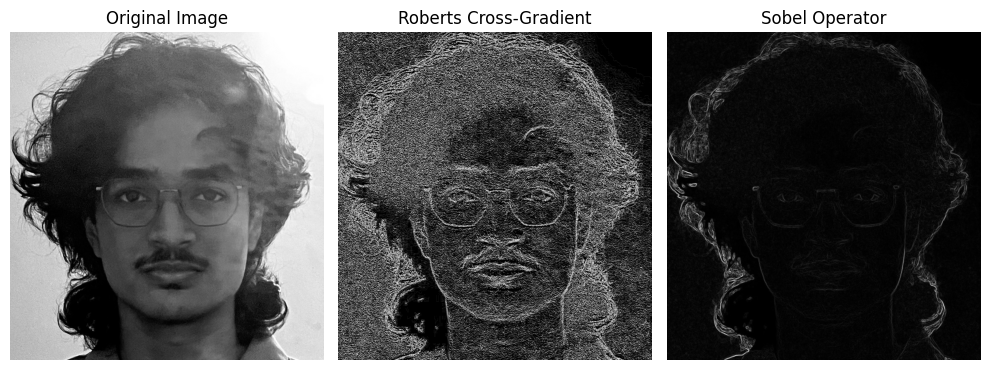

In [27]:
image = cv.imread("selfie.jpg", cv.IMREAD_GRAYSCALE)

roberts_x = np.array([[1, 0], [0, -1]], dtype=np.float32)
roberts_y = np.array([[0, 1], [-1, 0]], dtype=np.float32)

roberts_x_filtered = cv.filter2D(image, -1, roberts_x)
roberts_y_filtered = cv.filter2D(image, -1, roberts_y)

epsilon = 1e-10
roberts_gradient = np.sqrt(np.abs(roberts_x_filtered**2 + roberts_y_filtered**2) + epsilon)
roberts_gradient = cv.normalize(roberts_gradient, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)

sobel_x = cv.Sobel(image, cv.CV_64F, 1, 0, ksize=3)
sobel_y = cv.Sobel(image, cv.CV_64F, 0, 1, ksize=3)
sobel_gradient = np.sqrt(np.abs(sobel_x**2 + sobel_y**2) + epsilon)
sobel_gradient = cv.normalize(sobel_gradient, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)

plt.figure(figsize=(10,5))

plt.subplot(1,3,1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(roberts_gradient, cmap='gray')
plt.title("Roberts Cross-Gradient")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(sobel_gradient, cmap='gray')
plt.title("Sobel Operator")
plt.axis('off')

plt.tight_layout()
plt.show()

# 3 PART(g) OBSERVATIONS

The edges in roberts cross gradient are defined even for for thind details like moustache, eyebrows and glasses that is because it enhances diagnol edges more but the noise is significantly increased.

In sobel operator output image is similar to laplacian edge enhancement image but with lesser noise. It gives the defined edges for the major intensity changes in the image that is at the boundaries of the image and it gives better horizontal and vertical edges.


# 3. SPATIAL FILTERING (h)

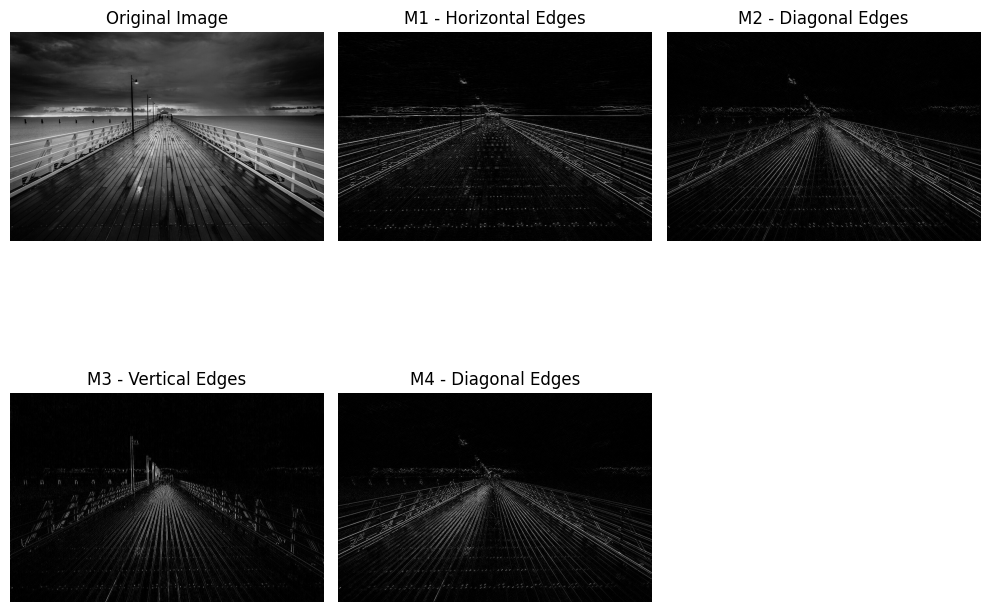

In [28]:
image = cv.imread("lines.jpg", cv.IMREAD_GRAYSCALE)

M1 = np.array([[-1, -1, -1], [2, 2, 2], [-1, -1, -1]], dtype=np.float32)
M2 = np.array([[2, -1, -1], [-1, 2, -1], [-1, -1, 2]], dtype=np.float32)
M3 = np.array([[-1, 2, -1], [-1, 2, -1], [-1, 2, -1]], dtype=np.float32)
M4 = np.array([[-1, -1, 2], [-1, 2, -1], [2, -1, -1]], dtype=np.float32)

filtered_M1 = cv.filter2D(image, -1, M1)
filtered_M2 = cv.filter2D(image, -1, M2)
filtered_M3 = cv.filter2D(image, -1, M3)
filtered_M4 = cv.filter2D(image, -1, M4)

plt.figure(figsize=(10,8))

plt.subplot(2,3,1)
plt.imshow(image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(2,3,2)
plt.imshow(filtered_M1, cmap='gray')
plt.title("M1 - Horizontal Edges")
plt.axis('off')

plt.subplot(2,3,3)
plt.imshow(filtered_M2, cmap='gray')
plt.title("M2 - Diagonal Edges")
plt.axis('off')

plt.subplot(2,3,4)
plt.imshow(filtered_M3, cmap='gray')
plt.title("M3 - Vertical Edges")
plt.axis('off')

plt.subplot(2,3,5)
plt.imshow(filtered_M4, cmap='gray')
plt.title("M4 - Diagonal Edges")
plt.axis('off')

plt.tight_layout()
plt.show()

# 3 PART(h) OBSERVATIONS

The M1 mask as we can see it in the matrix it enhances the horizontal edges. The M1 mask enhances horizontal edges more than any other edge. This results in better detection of text or any horizontally aligned features.

The M2 mask enhances diagonal edges as we can see in the matrix the weights are more in the top left to bottom right direction in  a diagonal manner. This means that diagonal features like slanted shadows become more defined. However, horizontal and vertical edges arent clear, making boundaries of the image less sharp.

The M3 mask enhances vertical edges, which can be seen from the matrix where the 2nd column is given highest weightage. Since vertical edges are enhanced but horizontal edges are less visible, leading to a loss of detail like when if the image has texts or horizontal lines.

The M4 mask enhances diagonal edges from top right to bottom left as the weights assigned in the matrix. This filter highlights edges that align along this direction. Similar to M2, horizontal and vertical edges are not visible much, meaning some detail may not be clear.

# 4. HISTOGRAM EQUALIZATION AND MATCHING (a) EQUALIZATION

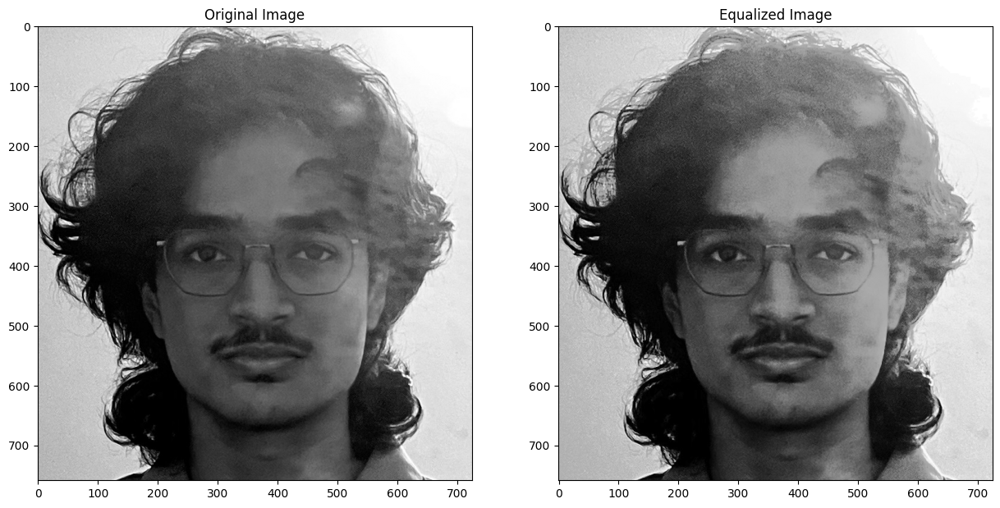

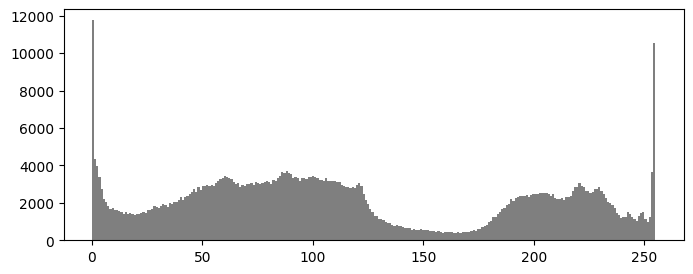

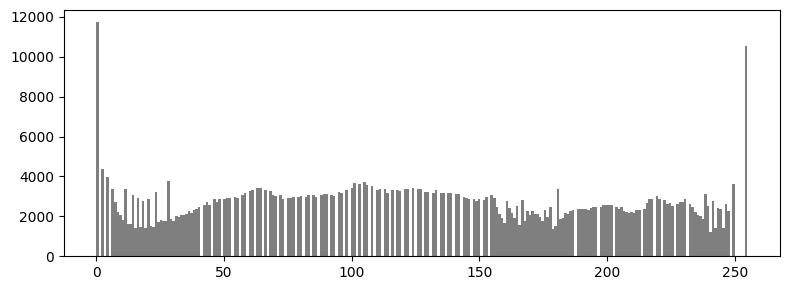

In [3]:
image = cv.imread("selfie.jpg", cv.IMREAD_GRAYSCALE)

hist_eq_image = cv.equalizeHist(image)

fig,ax = plt.subplots(1,2,figsize=(15,20))

ax[0].imshow(image,cmap='gray')
ax[0].set_title('Original Image')

ax[1].imshow(hist_eq_image,cmap='gray')
ax[1].set_title('Equalized Image')

plt.figure(figsize=(8, 3))
plt.hist(image.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)

plt.figure(figsize=(8, 3))
plt.hist(hist_eq_image.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)

plt.tight_layout()
plt.show()

# 4.PART (a) OBSERVATIONS

The main goal of histogram is to distrubute the pixel intensities better and uniform to make the image look brighter and enhance the details.

The equalized image has better features visible like lips and moustache is more visibile clearly with better highlights and shadows to understand the image. The equalized image has better contrast than the original image.

But the equalized image looks a bit more noisy than the original image.

In the histogram of original image the pixels are accumulated between the values of 50 to around 125 but near 150 there are very few pixels but after equalizing it the pixels are redistributed and in the histogram of equalized image from 50 to 200 they all contain almost same number of pixels. 

Hence in orignal image the contrast is bad because the pixels are accumulated near one region but after equalizing the pixels are distributed which increases the image contrast.


# 4. HISTOGRAM EQUALIZATION AND MATCHING (b) MATCHING

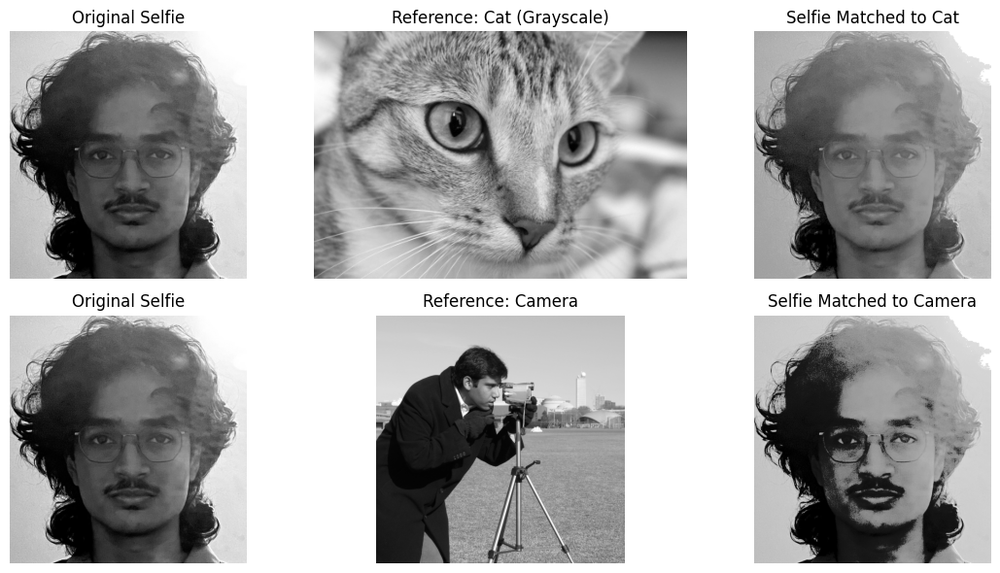

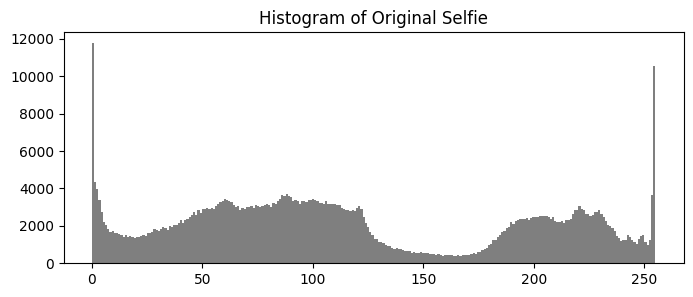

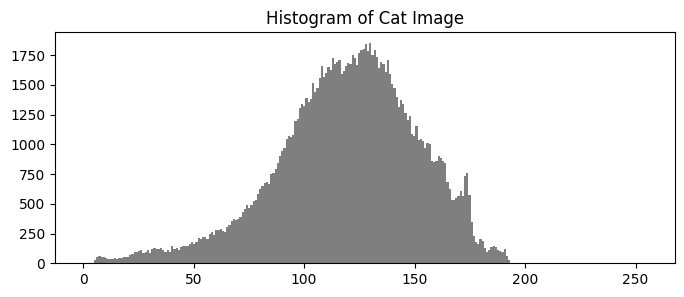

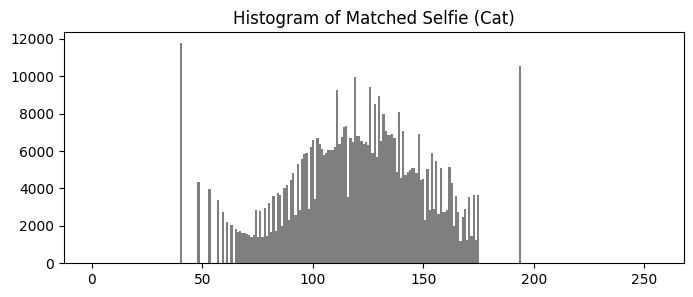

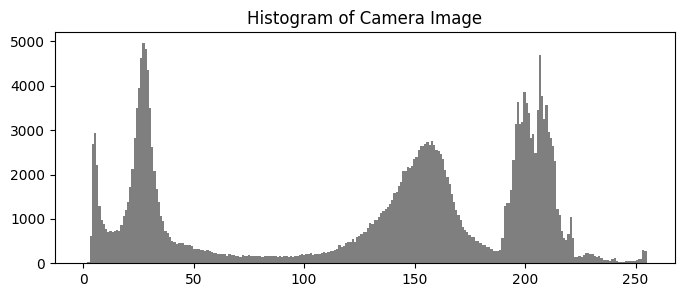

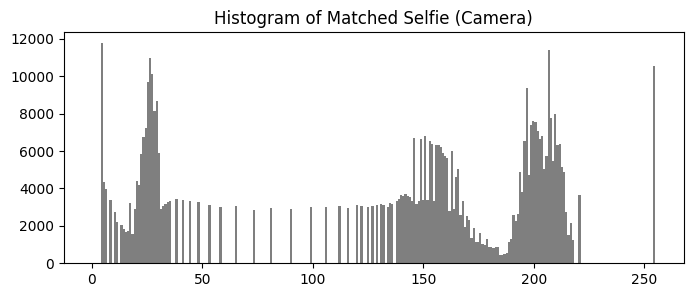

In [30]:

selfie = cv.imread("selfie.jpg", cv.IMREAD_GRAYSCALE)

cat_image = cv.cvtColor(ski.data.chelsea(), cv.COLOR_RGB2GRAY)
camera_image = ski.data.camera()

selfie_matched_cat = ski.exposure.match_histograms(selfie, cat_image, channel_axis=None)
selfie_matched_camera = ski.exposure.match_histograms(selfie, camera_image, channel_axis=None)

fig, axes = plt.subplots(2, 3, figsize=(12,6))

axes[0,0].imshow(selfie, cmap='gray')
axes[0,0].set_title("Original Selfie")
axes[0,0].axis("off")

axes[0,1].imshow(cat_image, cmap='gray')
axes[0,1].set_title("Reference: Cat (Grayscale)")
axes[0,1].axis("off")

axes[0,2].imshow(selfie_matched_cat, cmap='gray')
axes[0,2].set_title("Selfie Matched to Cat")
axes[0,2].axis("off")

axes[1,0].imshow(selfie, cmap='gray')
axes[1,0].set_title("Original Selfie")
axes[1,0].axis("off")

axes[1,1].imshow(camera_image, cmap='gray')
axes[1,1].set_title("Reference: Camera")
axes[1,1].axis("off")

axes[1,2].imshow(selfie_matched_camera, cmap='gray')
axes[1,2].set_title("Selfie Matched to Camera")
axes[1,2].axis("off")

plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 3))
plt.hist(selfie.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)
plt.title("Histogram of Original Selfie")

plt.figure(figsize=(8, 3))
plt.hist(cat_image.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)
plt.title("Histogram of Cat Image")

plt.figure(figsize=(8, 3))
plt.hist(selfie_matched_cat.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)
plt.title("Histogram of Matched Selfie (Cat)")

plt.figure(figsize=(8, 3))
plt.hist(camera_image.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)
plt.title("Histogram of Camera Image")

plt.figure(figsize=(8, 3))
plt.hist(selfie_matched_camera.ravel(), bins=256, range=(0, 255), color='black', alpha=0.5)
plt.title("Histogram of Matched Selfie (Camera)")

plt.show()

# 4.PART (b) OBSERVATIONS

In the selfie matched with the cat image the selfie is brighter and lesser shadows matching like how it is in the image of cat. It adopts to contrast of the cat image.

In the selfie image matched with camera the seflie has high shadow intensity and the darker regions are made much more darker. It has mostly high intensity or low intensity pixels with lesser pixels in the mid range.

In the histogram of cat matched with selfie we can see that it resembles the cat's histogram but it is distributed like the original selfie and it also has the extreme values like in the original image.

In the histogram of camera matched with selfie we can see that it is distributed as the original image but has the features of the camera and it also attains the extreme values from the original image.